# Evaluate YCSB Result

<img src="https://raw.githubusercontent.com/Beuth-Erdelt/Benchmark-Experiment-Host-Manager/master/docs/workflow-sketch-simple.png"/>

References:
1. https://github.com/brianfrankcooper/YCSB/wiki/Running-a-Workload

## Import Packages

In [1]:
#!pip list

%matplotlib inline

import pandas as pd
import os
import re
import matplotlib.pyplot as plt
import pickle
# Some nice output
pd.set_option("display.max_rows", None)
pd.set_option('display.max_colwidth', None)
from IPython.display import display, Markdown

import dbmsbenchmarker

import evaluator

## Pick Result

In [2]:
code = "1684758882"
path = "./"
name_pattern = "PostgreSQL-32-(.+?)-(.+?)-1"
peak_benchmark = 65536
peak_loading = 2**14*2

## Helper Functions

In [3]:
def plot_comparison(df_aggregated, x, y, colum, title, marker=None):
    if y in df_aggregated.columns:
        ax = evaluation.plot(df_aggregated.rename(columns={'pod_count': 'pods'}), column=column, x=x, y=y, figsize=(2,2))
        ax.title.set_size(10)
        ax.set_title(title)
        plt.legend(loc='lower right', title='num pods')
        if marker is not None:
            ax.axvline(marker, color='k', linestyle='--')
    else:
        print("{} not avalable".format(y))

def plot_variation(df_groups, max_pod_count, column):
    if column in df_groups:
        ax = df_groups[df_groups['pod_count']==max_pod_count].boxplot(by='target', column=column, rot=90, figsize=(2,2), grid=False)
        ax.get_figure().suptitle('')
        ax.title.set_size(10)
    else:
        print("{} not avalable".format(column))

def plot_metric(df, title, marker=None):
    global name_pattern
    df = pd.DataFrame(df, columns=["new"])
    #found = re.findall('PostgreSQL-AWS-32-(.+?)-(.+?)-1\n', stdout)
    #print(found)
    #df['vusers'] = 
    #print(name_pattern)
    #print(df)
    liste = list(df.index.map(lambda x: re.findall(name_pattern, x)))
    #print(liste)
    df['pods'] = [int(x[0][0]) for x in liste]
    df['target'] = [int(int(x[0][1])) for x in liste]
    #df['target'] = [int(int(x[0][1])/16384) for x in liste]
    #df['config'] = [x[0] for x in liste]
    #df.set_index('vusers', inplace=True)
    #ax = df.plot.bar(legend=False, figsize=(2,2), title="SUT CPU")
    #df.plot.bar(x='target')
    df = df.pivot(columns='pods', index='target', values='new')
    ax = df.plot(figsize=(2,2), title=title)
    plt.legend(title='num pods')
    ax.set_ylim(0, df.max().max()*1.05)
    ax.title.set_size(10)
    if marker is not None:
        ax.axvline(marker, color='k', linestyle='--')


## Start Evaluation

In [4]:
evaluation = evaluator.ycsb(code=code, path=path)

# Prepare Result

This has to be done only once. Prepared results will be stored in result folder.

## Transform all Benchmarking Log Files to DataFrames

We also pick the first log file to be an example for later

In [5]:
filename_example = ""

directory = os.fsencode(path+"/"+code)
for file in os.listdir(directory):
    filename = os.fsdecode(file)
    if filename.startswith("bexhoma-benchmarker") and filename.endswith(".log"):
        #print("filename:", filename)
        pod_name = filename[filename.rindex("-")+1:-len(".log")]
        #print("pod_name:", pod_name)
        jobname = filename[len("bexhoma-benchmarker-"):-len("-"+pod_name+".log")]
        #print("jobname:", jobname)
        evaluation.end_benchmarking(jobname)
        filename_example = filename

### Show a DataFrame for Single Pod as Example

In [6]:
filename = path+"/"+code+"/"+filename_example+".df.pickle"
print(filename)
df = pd.read_pickle(filename)
df

.//1684758882/bexhoma-benchmarker-postgresql-32-8-98304-1684758882-1-1-wjjww.log.df.pickle


,connection,configuration,experiment_run,client,pod,pod_count,threads,target,sf,workload,...,[CLEANUP].MaxLatency(us),[CLEANUP].95thPercentileLatency(us),[CLEANUP].99thPercentileLatency(us),[UPDATE].Operations,[UPDATE].AverageLatency(us),[UPDATE].MinLatency(us),[UPDATE].MaxLatency(us),[UPDATE].95thPercentileLatency(us),[UPDATE].99thPercentileLatency(us),[UPDATE].Return=OK
PostgreSQL-32-8-98304-1,,,,,,,,,,,,,,,,,,,,,
0,PostgreSQL-32-8-98304-1,PostgreSQL-32-8-98304,1,1,wjjww,8,4,12288,30,a,...,299,299,299,1874342,640.6968872276244,104,18579455,1043,3525,1874342


## Transform all Loading Log Files to DataFrames

We also pick the first log file to be an example for later

In [7]:
directory = os.fsencode(path+"/"+code)
for file in os.listdir(directory):
    filename = os.fsdecode(file)
    if filename.startswith("bexhoma-loading") and filename.endswith(".sensor.log"):
        #print("filename:", filename)
        pod_name = filename[filename.rindex("-")+1:-len(".log")]
        #print("pod_name:", pod_name)
        jobname = filename[len("bexhoma-loading-"):-len("-"+pod_name+".sensor.log")]
        #print("jobname:", jobname)
        evaluation.end_loading(jobname)

### Show a DataFrame for Single Pod as Example

In [8]:
filename = path+"/"+code+"/"+filename_example+".df.pickle"
print(filename)
df = pd.read_pickle(filename)
df

.//1684758882/bexhoma-benchmarker-postgresql-32-8-98304-1684758882-1-1-wjjww.log.df.pickle


,connection,configuration,experiment_run,client,pod,pod_count,threads,target,sf,workload,...,[CLEANUP].MaxLatency(us),[CLEANUP].95thPercentileLatency(us),[CLEANUP].99thPercentileLatency(us),[UPDATE].Operations,[UPDATE].AverageLatency(us),[UPDATE].MinLatency(us),[UPDATE].MaxLatency(us),[UPDATE].95thPercentileLatency(us),[UPDATE].99thPercentileLatency(us),[UPDATE].Return=OK
PostgreSQL-32-8-98304-1,,,,,,,,,,,,,,,,,,,,,
0,PostgreSQL-32-8-98304-1,PostgreSQL-32-8-98304,1,1,wjjww,8,4,12288,30,a,...,299,299,299,1874342,640.6968872276244,104,18579455,1043,3525,1874342


## Transform all DataFrames into Single Result DataFrame

In [9]:
evaluation.evaluate_results()

# Get Loading Result

In [10]:
df = evaluation.get_df_loading()

df = df.sort_values(['configuration','experiment_run','client'])

df = df[df.columns.drop(list(df.filter(regex='FAILED')))]

df.T

connection_pod,PostgreSQL-32-1-114688-1,PostgreSQL-32-1-131072-1,PostgreSQL-32-1-16384-1,PostgreSQL-32-1-32768-1,PostgreSQL-32-1-49152-1,PostgreSQL-32-1-65536-1,PostgreSQL-32-1-81920-1,PostgreSQL-32-1-98304-1,PostgreSQL-32-8-114688-1,PostgreSQL-32-8-114688-2,...,PostgreSQL-32-8-81920-7,PostgreSQL-32-8-81920-8,PostgreSQL-32-8-98304-1,PostgreSQL-32-8-98304-2,PostgreSQL-32-8-98304-3,PostgreSQL-32-8-98304-4,PostgreSQL-32-8-98304-5,PostgreSQL-32-8-98304-6,PostgreSQL-32-8-98304-7,PostgreSQL-32-8-98304-8
connection,PostgreSQL-32-1-114688,PostgreSQL-32-1-131072,PostgreSQL-32-1-16384,PostgreSQL-32-1-32768,PostgreSQL-32-1-49152,PostgreSQL-32-1-65536,PostgreSQL-32-1-81920,PostgreSQL-32-1-98304,PostgreSQL-32-8-114688,PostgreSQL-32-8-114688,...,PostgreSQL-32-8-81920,PostgreSQL-32-8-81920,PostgreSQL-32-8-98304,PostgreSQL-32-8-98304,PostgreSQL-32-8-98304,PostgreSQL-32-8-98304,PostgreSQL-32-8-98304,PostgreSQL-32-8-98304,PostgreSQL-32-8-98304,PostgreSQL-32-8-98304
configuration,PostgreSQL-32-1-114688,PostgreSQL-32-1-131072,PostgreSQL-32-1-16384,PostgreSQL-32-1-32768,PostgreSQL-32-1-49152,PostgreSQL-32-1-65536,PostgreSQL-32-1-81920,PostgreSQL-32-1-98304,PostgreSQL-32-8-114688,PostgreSQL-32-8-114688,...,PostgreSQL-32-8-81920,PostgreSQL-32-8-81920,PostgreSQL-32-8-98304,PostgreSQL-32-8-98304,PostgreSQL-32-8-98304,PostgreSQL-32-8-98304,PostgreSQL-32-8-98304,PostgreSQL-32-8-98304,PostgreSQL-32-8-98304,PostgreSQL-32-8-98304
experiment_run,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
client,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
pod,tx5d5.sensor,b9gzf.sensor,mr62r.sensor,9fbk6.sensor,gs5fb.sensor,6hqzb.sensor,nkd9n.sensor,xzd7w.sensor,5x62v.sensor,7bc2c.sensor,...,qpc6h.sensor,vtqn4.sensor,6xx8q.sensor,ghmf9.sensor,gqw9m.sensor,jln48.sensor,n9xct.sensor,p78x4.sensor,s4t2s.sensor,zklhx.sensor
pod_count,1,1,1,1,1,1,1,1,8,8,...,8,8,8,8,8,8,8,8,8,8
threads,32,32,32,32,32,32,32,32,4,4,...,4,4,4,4,4,4,4,4,4,4
target,114688,131072,16384,32768,49152,65536,81920,98304,14336,14336,...,10240,10240,12288,12288,12288,12288,12288,12288,12288,12288
sf,30,30,30,30,30,30,30,30,30,30,...,30,30,30,30,30,30,30,30,30,30
workload,a,a,a,a,a,a,a,a,a,a,...,a,a,a,a,a,a,a,a,a,a


## Plot Results

### Set Data Types for Plotting

In [11]:
df.fillna(0, inplace=True)

df_plot = evaluation.loading_set_datatypes(df)

df_plot.sort_values('target', inplace=True)

### Remove Failed Pods

In [12]:
df_plot.drop(df_plot[df_plot['[OVERALL].Throughput(ops/sec)'] == 0].index, inplace=True)

df_plot.T

connection_pod,PostgreSQL-32-8-16384-2,PostgreSQL-32-8-16384-3,PostgreSQL-32-8-16384-4,PostgreSQL-32-8-16384-5,PostgreSQL-32-8-16384-6,PostgreSQL-32-8-16384-7,PostgreSQL-32-8-16384-8,PostgreSQL-32-8-16384-1,PostgreSQL-32-8-32768-4,PostgreSQL-32-8-32768-1,...,PostgreSQL-32-8-131072-6,PostgreSQL-32-8-131072-7,PostgreSQL-32-8-131072-1,PostgreSQL-32-1-32768-1,PostgreSQL-32-1-49152-1,PostgreSQL-32-1-65536-1,PostgreSQL-32-1-81920-1,PostgreSQL-32-1-98304-1,PostgreSQL-32-1-114688-1,PostgreSQL-32-1-131072-1
connection,PostgreSQL-32-8-16384,PostgreSQL-32-8-16384,PostgreSQL-32-8-16384,PostgreSQL-32-8-16384,PostgreSQL-32-8-16384,PostgreSQL-32-8-16384,PostgreSQL-32-8-16384,PostgreSQL-32-8-16384,PostgreSQL-32-8-32768,PostgreSQL-32-8-32768,...,PostgreSQL-32-8-131072,PostgreSQL-32-8-131072,PostgreSQL-32-8-131072,PostgreSQL-32-1-32768,PostgreSQL-32-1-49152,PostgreSQL-32-1-65536,PostgreSQL-32-1-81920,PostgreSQL-32-1-98304,PostgreSQL-32-1-114688,PostgreSQL-32-1-131072
configuration,PostgreSQL-32-8-16384,PostgreSQL-32-8-16384,PostgreSQL-32-8-16384,PostgreSQL-32-8-16384,PostgreSQL-32-8-16384,PostgreSQL-32-8-16384,PostgreSQL-32-8-16384,PostgreSQL-32-8-16384,PostgreSQL-32-8-32768,PostgreSQL-32-8-32768,...,PostgreSQL-32-8-131072,PostgreSQL-32-8-131072,PostgreSQL-32-8-131072,PostgreSQL-32-1-32768,PostgreSQL-32-1-49152,PostgreSQL-32-1-65536,PostgreSQL-32-1-81920,PostgreSQL-32-1-98304,PostgreSQL-32-1-114688,PostgreSQL-32-1-131072
experiment_run,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
client,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
pod,gb9j5.sensor,kjk85.sensor,mskcx.sensor,pcmmg.sensor,pmr6w.sensor,qmfjw.sensor,xrrbk.sensor,2hl8g.sensor,lvlv2.sensor,5m288.sensor,...,p6x48.sensor,p9pwx.sensor,2dbvt.sensor,9fbk6.sensor,gs5fb.sensor,6hqzb.sensor,nkd9n.sensor,xzd7w.sensor,tx5d5.sensor,b9gzf.sensor
pod_count,8,8,8,8,8,8,8,8,8,8,...,8,8,8,1,1,1,1,1,1,1
threads,4,4,4,4,4,4,4,4,4,4,...,4,4,4,32,32,32,32,32,32,32
target,2048,2048,2048,2048,2048,2048,2048,2048,4096,4096,...,16384,16384,16384,32768,49152,65536,81920,98304,114688,131072
sf,30,30,30,30,30,30,30,30,30,30,...,30,30,30,30,30,30,30,30,30,30
workload,a,a,a,a,a,a,a,a,a,a,...,a,a,a,a,a,a,a,a,a,a


### Plot Results per Number of Pods

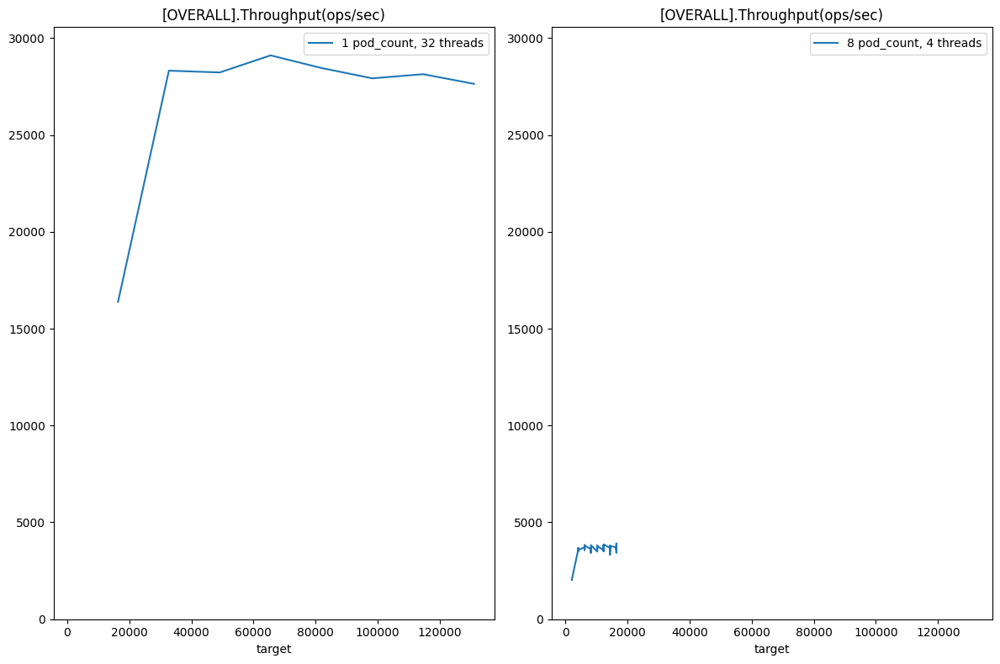

In [13]:
%matplotlib inline

column = "threads"
x = "target"
y = "[OVERALL].Throughput(ops/sec)"
evaluation.plot(df_plot, column=column, x=x, y=y, plot_by="pod_count")

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


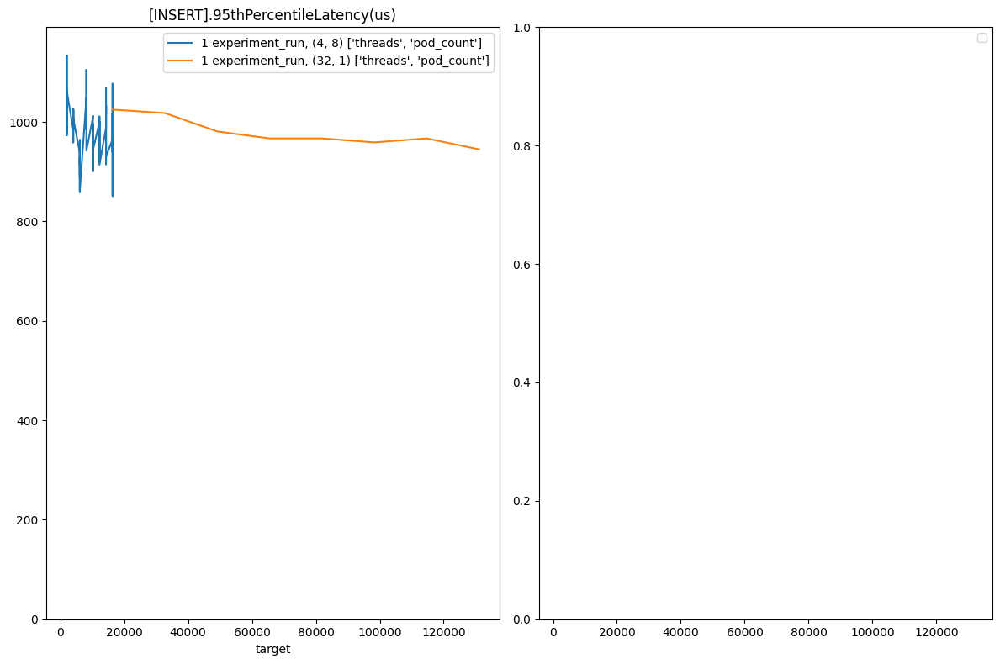

In [14]:
column = ["threads", "pod_count"]
x = "target"
y = "[INSERT].95thPercentileLatency(us)"
evaluation.plot(df_plot, column=column, x=x, y=y, plot_by="experiment_run")

## Aggregate by Parallel Pods

In [15]:
df = evaluation.get_df_loading()
df

,connection,configuration,experiment_run,client,pod,pod_count,threads,target,sf,workload,...,[CLEANUP].MaxLatency(us),[CLEANUP].95thPercentileLatency(us),[CLEANUP].99thPercentileLatency(us),[INSERT].Operations,[INSERT].AverageLatency(us),[INSERT].MinLatency(us),[INSERT].MaxLatency(us),[INSERT].95thPercentileLatency(us),[INSERT].99thPercentileLatency(us),[INSERT].Return=OK
connection_pod,,,,,,,,,,,,,,,,,,,,,
PostgreSQL-32-1-114688-1,PostgreSQL-32-1-114688,PostgreSQL-32-1-114688,1,0,tx5d5.sensor,1,32,114688,30,a,...,186,144,186,30000000,1024.3594275,629,18612223,967,1261,30000000
PostgreSQL-32-1-131072-1,PostgreSQL-32-1-131072,PostgreSQL-32-1-131072,1,0,b9gzf.sensor,1,32,131072,30,a,...,199,154,199,30000000,1033.9956250666667,636,24150015,945,1268,30000000
PostgreSQL-32-1-16384-1,PostgreSQL-32-1-16384,PostgreSQL-32-1-16384,1,0,mr62r.sensor,1,32,16384,30,a,...,692,450,692,30000000,835.0811325,633,385791,1025,1180,30000000
PostgreSQL-32-1-32768-1,PostgreSQL-32-1-32768,PostgreSQL-32-1-32768,1,0,9fbk6.sensor,1,32,32768,30,a,...,195,140,195,30000000,1019.0929389666667,630,26443775,1018,1261,30000000
PostgreSQL-32-1-49152-1,PostgreSQL-32-1-49152,PostgreSQL-32-1-49152,1,0,gs5fb.sensor,1,32,49152,30,a,...,199,147,199,30000000,1042.6627607666667,630,23822335,981,1268,30000000
PostgreSQL-32-1-65536-1,PostgreSQL-32-1-65536,PostgreSQL-32-1-65536,1,0,6hqzb.sensor,1,32,65536,30,a,...,206,132,206,30000000,1032.8564868,629,23887871,967,1255,30000000
PostgreSQL-32-1-81920-1,PostgreSQL-32-1-81920,PostgreSQL-32-1-81920,1,0,nkd9n.sensor,1,32,81920,30,a,...,214,129,214,30000000,1039.4797652333334,636,23085055,967,1261,30000000
PostgreSQL-32-1-98304-1,PostgreSQL-32-1-98304,PostgreSQL-32-1-98304,1,0,xzd7w.sensor,1,32,98304,30,a,...,375,115,375,30000000,1031.2387599666667,630,23478271,959,1263,30000000
PostgreSQL-32-8-114688-1,PostgreSQL-32-8-114688,PostgreSQL-32-8-114688,1,0,5x62v.sensor,8,4,14336,30,a,...,187,187,187,3750000,1071.3269501333334,653,23658495,1034,1278,3750000


In [16]:
df.fillna(0, inplace=True)
df_plot = evaluation.loading_set_datatypes(df)

df_aggregated = evaluation.loading_aggregate_by_parallel_pods(df_plot)
df_aggregated.sort_values('target', inplace=True)
df_aggregated.T

,PostgreSQL-32-1-16384,PostgreSQL-32-8-16384,PostgreSQL-32-1-32768,PostgreSQL-32-8-32768,PostgreSQL-32-1-49152,PostgreSQL-32-8-49152,PostgreSQL-32-1-65536,PostgreSQL-32-8-65536,PostgreSQL-32-1-81920,PostgreSQL-32-8-81920,PostgreSQL-32-1-98304,PostgreSQL-32-8-98304,PostgreSQL-32-1-114688,PostgreSQL-32-8-114688,PostgreSQL-32-1-131072,PostgreSQL-32-8-131072
connection,PostgreSQL-32-1-16384,PostgreSQL-32-8-16384,PostgreSQL-32-1-32768,PostgreSQL-32-8-32768,PostgreSQL-32-1-49152,PostgreSQL-32-8-49152,PostgreSQL-32-1-65536,PostgreSQL-32-8-65536,PostgreSQL-32-1-81920,PostgreSQL-32-8-81920,PostgreSQL-32-1-98304,PostgreSQL-32-8-98304,PostgreSQL-32-1-114688,PostgreSQL-32-8-114688,PostgreSQL-32-1-131072,PostgreSQL-32-8-131072
configuration,PostgreSQL-32-1-16384,PostgreSQL-32-8-16384,PostgreSQL-32-1-32768,PostgreSQL-32-8-32768,PostgreSQL-32-1-49152,PostgreSQL-32-8-49152,PostgreSQL-32-1-65536,PostgreSQL-32-8-65536,PostgreSQL-32-1-81920,PostgreSQL-32-8-81920,PostgreSQL-32-1-98304,PostgreSQL-32-8-98304,PostgreSQL-32-1-114688,PostgreSQL-32-8-114688,PostgreSQL-32-1-131072,PostgreSQL-32-8-131072
experiment_run,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
client,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
pod,mr62r.sensor,2hl8g.sensorgb9j5.sensorkjk85.sensormskcx.sensorpcmmg.sensorpmr6w.sensorqmfjw.sensorxrrbk.sensor,9fbk6.sensor,5m288.sensordxlcv.sensorj97qc.sensorlvlv2.sensornzswp.sensorqk7pg.sensorthvmb.sensorvbs9b.sensor,gs5fb.sensor,7fnlv.sensor8pcnm.sensor9kkpj.sensorjlvdb.sensorm7bxp.sensors229l.sensorsb97n.sensorx2j79.sensor,6hqzb.sensor,42qlk.sensor5dqdh.sensor66dgh.sensor6778k.sensor6vllq.sensord8z5q.sensork8drx.sensorm4t2w.sensor,nkd9n.sensor,2gmfh.sensor7nlbl.sensorb2bbf.sensorlc56j.sensorlccsk.sensornqq5s.sensorqpc6h.sensorvtqn4.sensor,xzd7w.sensor,6xx8q.sensorghmf9.sensorgqw9m.sensorjln48.sensorn9xct.sensorp78x4.sensors4t2s.sensorzklhx.sensor,tx5d5.sensor,5x62v.sensor7bc2c.sensorc7w5h.sensordg57m.sensordn5vx.sensorhkqrv.sensorqbf55.sensorsr6t8.sensor,b9gzf.sensor,2dbvt.sensor2vfvb.sensor5qftv.sensorfwkgs.sensorn8gtm.sensorp6x48.sensorp9pwx.sensorvjc59.sensor
pod_count,1,8,1,8,1,8,1,8,1,8,1,8,1,8,1,8
threads,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32
target,16384,16384,32768,32768,49152,49152,65536,65536,81920,81920,98304,98304,114688,114688,131072,131072
sf,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30
workload,a,a,a,a,a,a,a,a,a,a,a,a,a,a,a,a


### Group by Connection

In [17]:
df_plot = evaluation.loading_set_datatypes(df)
df_groups = df_plot.groupby(['connection', 'pod'])

df_groups = df_groups.sum('target')
df_groups

,,experiment_run,client,pod_count,threads,target,sf,operations,batchsize,[OVERALL].RunTime(ms),[OVERALL].Throughput(ops/sec),...,[CLEANUP].MaxLatency(us),[CLEANUP].95thPercentileLatency(us),[CLEANUP].99thPercentileLatency(us),[INSERT].Operations,[INSERT].AverageLatency(us),[INSERT].MinLatency(us),[INSERT].MaxLatency(us),[INSERT].95thPercentileLatency(us),[INSERT].99thPercentileLatency(us),[INSERT].Return=OK
connection,pod,,,,,,,,,,,,,,,,,,,,,
PostgreSQL-32-1-114688,tx5d5.sensor,1,0,1,32,114688,30,30000000,-1,1066169.0,28138.128195,...,186.0,144.0,186.0,30000000,1024.359428,629.0,18612223.0,967.0,1261.0,30000000
PostgreSQL-32-1-131072,b9gzf.sensor,1,0,1,32,131072,30,30000000,-1,1085442.0,27638.510395,...,199.0,154.0,199.0,30000000,1033.995625,636.0,24150015.0,945.0,1268.0,30000000
PostgreSQL-32-1-16384,mr62r.sensor,1,0,1,32,16384,30,30000000,-1,1831226.0,16382.467265,...,692.0,450.0,692.0,30000000,835.081132,633.0,385791.0,1025.0,1180.0,30000000
PostgreSQL-32-1-32768,9fbk6.sensor,1,0,1,32,32768,30,30000000,-1,1059352.0,28319.198907,...,195.0,140.0,195.0,30000000,1019.092939,630.0,26443775.0,1018.0,1261.0,30000000
PostgreSQL-32-1-49152,gs5fb.sensor,1,0,1,32,49152,30,30000000,-1,1062779.0,28227.881808,...,199.0,147.0,199.0,30000000,1042.662761,630.0,23822335.0,981.0,1268.0,30000000
PostgreSQL-32-1-65536,6hqzb.sensor,1,0,1,32,65536,30,30000000,-1,1030604.0,29109.143764,...,206.0,132.0,206.0,30000000,1032.856487,629.0,23887871.0,967.0,1255.0,30000000
PostgreSQL-32-1-81920,nkd9n.sensor,1,0,1,32,81920,30,30000000,-1,1054230.0,28456.788367,...,214.0,129.0,214.0,30000000,1039.479765,636.0,23085055.0,967.0,1261.0,30000000
PostgreSQL-32-1-98304,xzd7w.sensor,1,0,1,32,98304,30,30000000,-1,1074369.0,27923.367111,...,375.0,115.0,375.0,30000000,1031.238760,630.0,23478271.0,959.0,1263.0,30000000
PostgreSQL-32-8-114688,5x62v.sensor,1,0,8,4,14336,30,3750000,-1,1032151.0,3633.189330,...,187.0,187.0,187.0,3750000,1071.326950,653.0,23658495.0,1034.0,1278.0,3750000


### Get Maximum Number of Parallel Pods

In [18]:
max_pod_count = df_groups['pod_count'].max()
max_pod_count

8

### Plot Varations

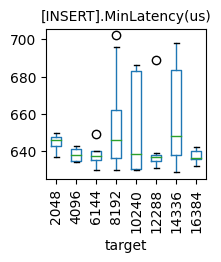

In [19]:
y='[INSERT].MinLatency(us)'
plot_variation(df_groups, max_pod_count, y)

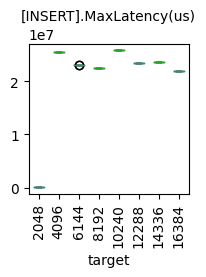

In [20]:
y='[INSERT].MaxLatency(us)'
plot_variation(df_groups, max_pod_count, y)

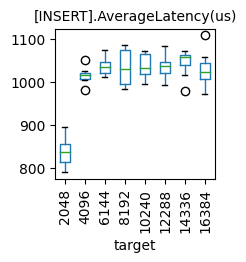

In [21]:
y='[INSERT].AverageLatency(us)'
plot_variation(df_groups, max_pod_count, y)

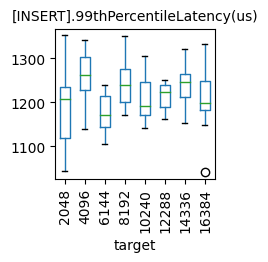

In [22]:
y='[INSERT].99thPercentileLatency(us)'
plot_variation(df_groups, max_pod_count, y)

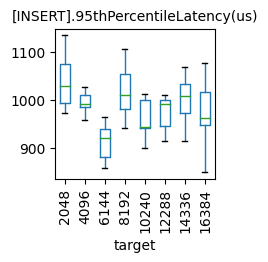

In [23]:
y='[INSERT].95thPercentileLatency(us)'
plot_variation(df_groups, max_pod_count, y)

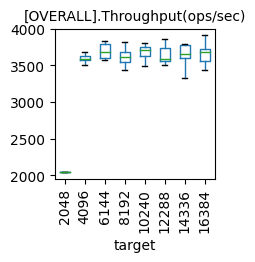

In [24]:
y='[OVERALL].Throughput(ops/sec)'
plot_variation(df_groups, max_pod_count, y)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


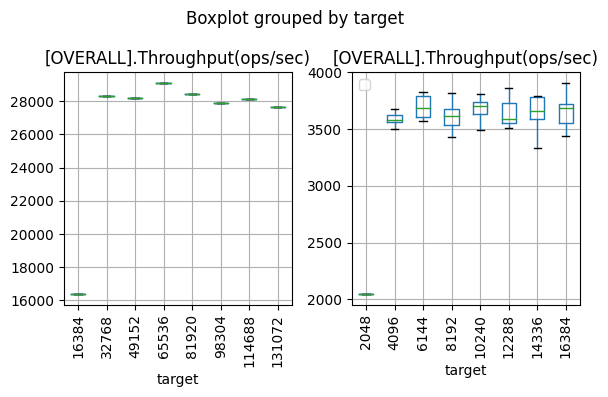

In [25]:
by='target'
column='[OVERALL].Throughput(ops/sec)'
groups = df_groups.groupby('pod_count')
rows = 1#(len(groups)+1)//2
row=0
col=0
fig, axes = plt.subplots(nrows=rows, ncols=2, squeeze=False, figsize=(6,4*rows))#, sharex=True
for key1, grp in groups:#df3.groupby(col1):
    ax = grp.boxplot(ax=axes[row,col], by='target', column='[OVERALL].Throughput(ops/sec)', figsize=(6,4), layout=(rows,2), rot=90)
    col = col + 1
    if col > 1:
        row = row + 1
        col = 0
plt.legend(loc='best')
plt.tight_layout()
plt.show()


### Plot Comparison

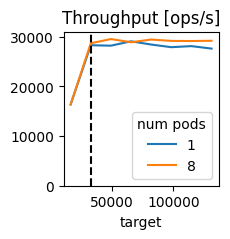

In [26]:
column = "pods"
x = "target"
y = "[OVERALL].Throughput(ops/sec)"
title = "Throughput [ops/s]"
plot_comparison(df_aggregated, x, y, column, title, peak_loading)

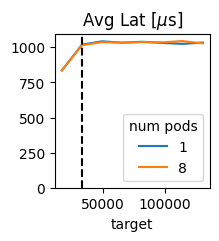

In [27]:
column = "pods"
x = "target"
y = "[INSERT].AverageLatency(us)"
title = "Avg Lat [$\mu$s]"
plot_comparison(df_aggregated, x, y, column, title, peak_loading)

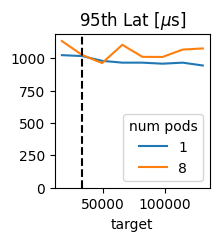

In [28]:
column = "pods"
x = "target"
y = "[INSERT].95thPercentileLatency(us)"
title = "95th Lat [$\mu$s]"
plot_comparison(df_aggregated, x, y, column, title, peak_loading)

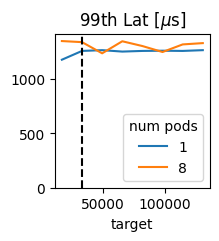

In [29]:
column = "pods"
x = "target"
y = "[INSERT].99thPercentileLatency(us)"
title = "99th Lat [$\mu$s]"
plot_comparison(df_aggregated, x, y, column, title, peak_loading)

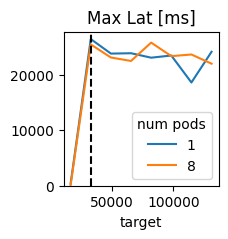

In [30]:
column = "pods"
x = "target"
y = "[INSERT].MaxLatency(us)"
y2 = "[INSERT].MaxLatency(ms)"
title = "Max Lat [ms]"
df_aggregated[y2] = df_aggregated[y]/1000.
plot_comparison(df_aggregated, x, y2, column, title, peak_loading)

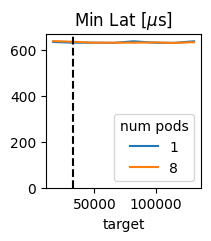

In [31]:
column = "pods"
x = "target"
y = "[INSERT].MinLatency(us)"
title = "Min Lat [$\mu$s]"
plot_comparison(df_aggregated, x, y, column, title, peak_loading)

# Get Benchmarking Result

In [32]:
df = evaluation.get_df_benchmarking()
#df = df[df.columns.drop(list(df.filter(regex='FAILED')))]
df.T

connection_pod,PostgreSQL-32-1-114688-1-1,PostgreSQL-32-1-131072-1-1,PostgreSQL-32-1-16384-1-1,PostgreSQL-32-1-32768-1-1,PostgreSQL-32-1-49152-1-1,PostgreSQL-32-1-65536-1-1,PostgreSQL-32-1-81920-1-1,PostgreSQL-32-1-98304-1-1,PostgreSQL-32-8-114688-1-1,PostgreSQL-32-8-114688-1-2,...,PostgreSQL-32-8-81920-1-7,PostgreSQL-32-8-81920-1-8,PostgreSQL-32-8-98304-1-1,PostgreSQL-32-8-98304-1-2,PostgreSQL-32-8-98304-1-3,PostgreSQL-32-8-98304-1-4,PostgreSQL-32-8-98304-1-5,PostgreSQL-32-8-98304-1-6,PostgreSQL-32-8-98304-1-7,PostgreSQL-32-8-98304-1-8
connection,PostgreSQL-32-1-114688-1,PostgreSQL-32-1-131072-1,PostgreSQL-32-1-16384-1,PostgreSQL-32-1-32768-1,PostgreSQL-32-1-49152-1,PostgreSQL-32-1-65536-1,PostgreSQL-32-1-81920-1,PostgreSQL-32-1-98304-1,PostgreSQL-32-8-114688-1,PostgreSQL-32-8-114688-1,...,PostgreSQL-32-8-81920-1,PostgreSQL-32-8-81920-1,PostgreSQL-32-8-98304-1,PostgreSQL-32-8-98304-1,PostgreSQL-32-8-98304-1,PostgreSQL-32-8-98304-1,PostgreSQL-32-8-98304-1,PostgreSQL-32-8-98304-1,PostgreSQL-32-8-98304-1,PostgreSQL-32-8-98304-1
configuration,PostgreSQL-32-1-114688,PostgreSQL-32-1-131072,PostgreSQL-32-1-16384,PostgreSQL-32-1-32768,PostgreSQL-32-1-49152,PostgreSQL-32-1-65536,PostgreSQL-32-1-81920,PostgreSQL-32-1-98304,PostgreSQL-32-8-114688,PostgreSQL-32-8-114688,...,PostgreSQL-32-8-81920,PostgreSQL-32-8-81920,PostgreSQL-32-8-98304,PostgreSQL-32-8-98304,PostgreSQL-32-8-98304,PostgreSQL-32-8-98304,PostgreSQL-32-8-98304,PostgreSQL-32-8-98304,PostgreSQL-32-8-98304,PostgreSQL-32-8-98304
experiment_run,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
client,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
pod,mwnxg,zp9vj,dpz6r,k6vs7,klpvs,7w4z9,chmc5,7lqx2,2jq82,8tw89,...,vhthf,xn2w5,45zhr,bhvd9,k4r5r,kq9kf,mlt4b,rksk7,vn5b4,wjjww
pod_count,1,1,1,1,1,1,1,1,8,8,...,8,8,8,8,8,8,8,8,8,8
threads,32,32,32,32,32,32,32,32,4,4,...,4,4,4,4,4,4,4,4,4,4
target,114688,131072,16384,32768,49152,65536,81920,98304,14336,14336,...,10240,10240,12288,12288,12288,12288,12288,12288,12288,12288
sf,30,30,30,30,30,30,30,30,30,30,...,30,30,30,30,30,30,30,30,30,30
workload,a,a,a,a,a,a,a,a,a,a,...,a,a,a,a,a,a,a,a,a,a


## Reconstruct Workflow out of Result

How many benchmarker have been used per configuration?

In [33]:
evaluation.reconstruct_workflow(df)

{'PostgreSQL-32-1-114688': [[1]],
 'PostgreSQL-32-1-131072': [[1]],
 'PostgreSQL-32-1-16384': [[1]],
 'PostgreSQL-32-1-32768': [[1]],
 'PostgreSQL-32-1-49152': [[1]],
 'PostgreSQL-32-1-65536': [[1]],
 'PostgreSQL-32-1-81920': [[1]],
 'PostgreSQL-32-1-98304': [[1]],
 'PostgreSQL-32-8-114688': [[8]],
 'PostgreSQL-32-8-131072': [[8]],
 'PostgreSQL-32-8-16384': [[8]],
 'PostgreSQL-32-8-32768': [[8]],
 'PostgreSQL-32-8-49152': [[8]],
 'PostgreSQL-32-8-65536': [[8]],
 'PostgreSQL-32-8-81920': [[8]],
 'PostgreSQL-32-8-98304': [[8]]}

## Plot Results

### Set Data Types for Plotting

In [34]:
df.fillna(0, inplace=True)
#df.drop(df[df['[READ].Operations'] == 0].index, inplace=True)
#df.drop(df[df['[READ].Return=OK'] == 0].index, inplace=True)

df_plot = evaluation.benchmarking_set_datatypes(df)
df_plot.sort_values('target', inplace=True)
df_plot

,connection,configuration,experiment_run,client,pod,pod_count,threads,target,sf,workload,...,[CLEANUP].MaxLatency(us),[CLEANUP].95thPercentileLatency(us),[CLEANUP].99thPercentileLatency(us),[UPDATE].Operations,[UPDATE].AverageLatency(us),[UPDATE].MinLatency(us),[UPDATE].MaxLatency(us),[UPDATE].95thPercentileLatency(us),[UPDATE].99thPercentileLatency(us),[UPDATE].Return=OK
connection_pod,,,,,,,,,,,,,,,,,,,,,
PostgreSQL-32-8-16384-1-2,PostgreSQL-32-8-16384-1,PostgreSQL-32-8-16384,1,1,6qp9s,8,4,2048,30,a,...,267.0,267.0,267.0,1875349,279.281535,111.0,130815.0,430.0,692.0,1875349
PostgreSQL-32-8-16384-1-3,PostgreSQL-32-8-16384-1,PostgreSQL-32-8-16384,1,1,77mw4,8,4,2048,30,a,...,228.0,228.0,228.0,1874880,279.843256,109.0,77247.0,503.0,648.0,1874880
PostgreSQL-32-8-16384-1-4,PostgreSQL-32-8-16384-1,PostgreSQL-32-8-16384,1,1,cpwg6,8,4,2048,30,a,...,244.0,244.0,244.0,1875427,269.904560,109.0,130175.0,415.0,649.0,1875427
PostgreSQL-32-8-16384-1-5,PostgreSQL-32-8-16384-1,PostgreSQL-32-8-16384,1,1,cxgj6,8,4,2048,30,a,...,204.0,204.0,204.0,1875337,297.950520,109.0,76415.0,467.0,640.0,1875337
PostgreSQL-32-8-16384-1-6,PostgreSQL-32-8-16384-1,PostgreSQL-32-8-16384,1,1,jpmmp,8,4,2048,30,a,...,292.0,292.0,292.0,1875014,261.791274,108.0,55775.0,398.0,625.0,1875014
PostgreSQL-32-8-16384-1-7,PostgreSQL-32-8-16384-1,PostgreSQL-32-8-16384,1,1,rt4r9,8,4,2048,30,a,...,230.0,230.0,230.0,1873638,291.152009,114.0,118847.0,515.0,655.0,1873638
PostgreSQL-32-8-16384-1-8,PostgreSQL-32-8-16384-1,PostgreSQL-32-8-16384,1,1,tfbqm,8,4,2048,30,a,...,215.0,215.0,215.0,1875605,285.543071,113.0,127295.0,491.0,633.0,1875605
PostgreSQL-32-8-16384-1-1,PostgreSQL-32-8-16384-1,PostgreSQL-32-8-16384,1,1,28mm2,8,4,2048,30,a,...,238.0,238.0,238.0,1873921,259.960231,108.0,88511.0,461.0,614.0,1873921
PostgreSQL-32-8-32768-1-4,PostgreSQL-32-8-32768-1,PostgreSQL-32-8-32768,1,1,j2j7f,8,4,4096,30,a,...,324.0,324.0,324.0,1876703,312.227578,107.0,735231.0,478.0,929.0,1876703


### Plot Results per Number of Pods

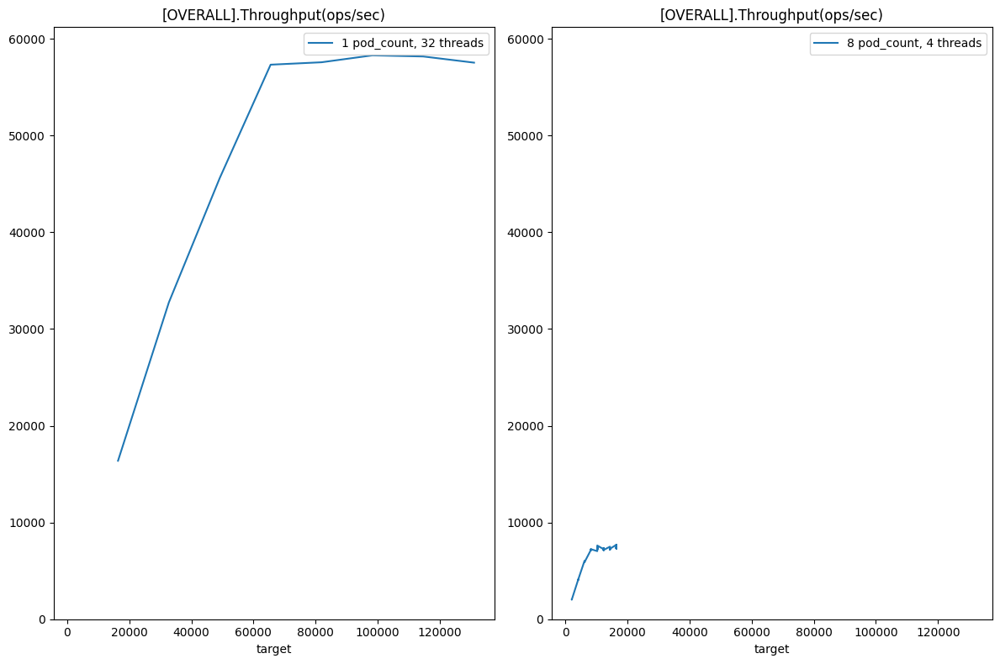

In [35]:
%matplotlib inline

column = "threads"
x = "target"
y = "[OVERALL].Throughput(ops/sec)"
evaluation.plot(df_plot, column=column, x=x, y=y, plot_by="pod_count")

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


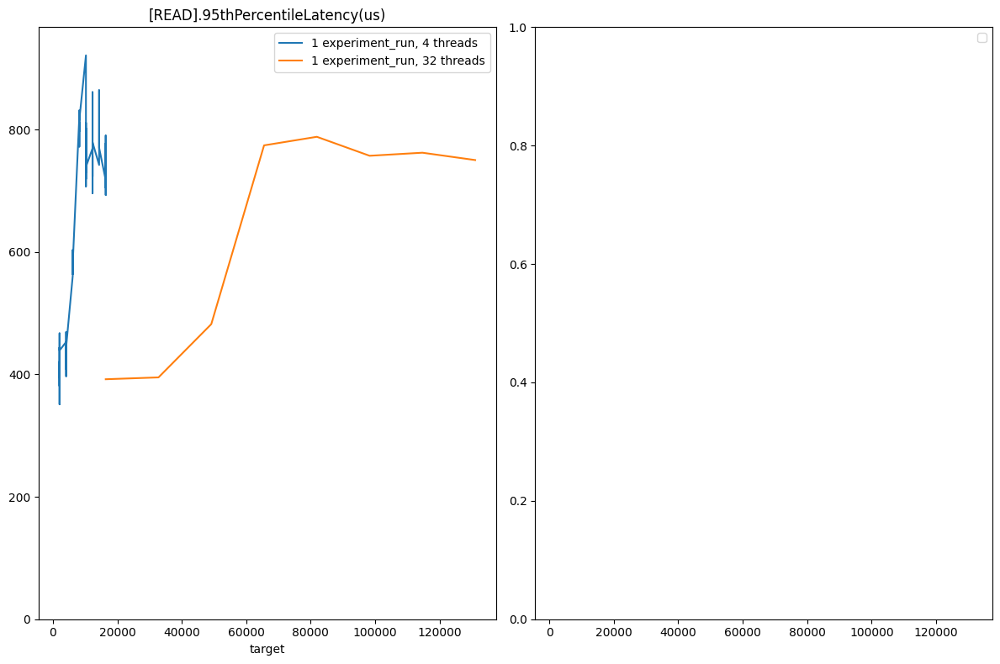

In [36]:
column = "threads"
x = "target"
y = "[READ].95thPercentileLatency(us)"
if y in df_plot.columns:
    evaluation.plot(df_plot, column=column, x=x, y=y, plot_by="experiment_run")

## Aggregate by Parallel Pods

In [37]:
df = evaluation.get_df_benchmarking()
df.fillna(0, inplace=True)
#df.drop(df[df['[READ].Operations'] == 0].index, inplace=True)
#df.drop(df[df['[READ].Return=OK'] == 0].index, inplace=True)
df_plot = evaluation.benchmarking_set_datatypes(df)
df_aggregated = evaluation.benchmarking_aggregate_by_parallel_pods(df_plot)
df_aggregated.sort_values('target', inplace=True)
df_aggregated.T

,PostgreSQL-32-1-16384-1,PostgreSQL-32-8-16384-1,PostgreSQL-32-1-32768-1,PostgreSQL-32-8-32768-1,PostgreSQL-32-1-49152-1,PostgreSQL-32-8-49152-1,PostgreSQL-32-1-65536-1,PostgreSQL-32-8-65536-1,PostgreSQL-32-1-81920-1,PostgreSQL-32-8-81920-1,PostgreSQL-32-1-98304-1,PostgreSQL-32-8-98304-1,PostgreSQL-32-1-114688-1,PostgreSQL-32-8-114688-1,PostgreSQL-32-1-131072-1,PostgreSQL-32-8-131072-1
connection,PostgreSQL-32-1-16384-1,PostgreSQL-32-8-16384-1,PostgreSQL-32-1-32768-1,PostgreSQL-32-8-32768-1,PostgreSQL-32-1-49152-1,PostgreSQL-32-8-49152-1,PostgreSQL-32-1-65536-1,PostgreSQL-32-8-65536-1,PostgreSQL-32-1-81920-1,PostgreSQL-32-8-81920-1,PostgreSQL-32-1-98304-1,PostgreSQL-32-8-98304-1,PostgreSQL-32-1-114688-1,PostgreSQL-32-8-114688-1,PostgreSQL-32-1-131072-1,PostgreSQL-32-8-131072-1
configuration,PostgreSQL-32-1-16384,PostgreSQL-32-8-16384,PostgreSQL-32-1-32768,PostgreSQL-32-8-32768,PostgreSQL-32-1-49152,PostgreSQL-32-8-49152,PostgreSQL-32-1-65536,PostgreSQL-32-8-65536,PostgreSQL-32-1-81920,PostgreSQL-32-8-81920,PostgreSQL-32-1-98304,PostgreSQL-32-8-98304,PostgreSQL-32-1-114688,PostgreSQL-32-8-114688,PostgreSQL-32-1-131072,PostgreSQL-32-8-131072
experiment_run,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
client,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
pod,dpz6r,28mm26qp9s77mw4cpwg6cxgj6jpmmprt4r9tfbqm,k6vs7,2pf8r5szs7cfgn7j2j7flc8b4mt7d6p9tmsrt62c,klpvs,5wh9k998gfghk57rvqs4sfzq5sgxpftqqdcxwgtc,7w4z9,5spjql25nllrgp7nws4xrh8zlvc88wwp69bz58tr,chmc5,9hk6b9wm6bb7bh7kfjzhkrdkbtt4fmvhthfxn2w5,7lqx2,45zhrbhvd9k4r5rkq9kfmlt4brksk7vn5b4wjjww,mwnxg,2jq828tw89fzvfvhg76gjwcxmknc8qkp9r9sf8fh,zp9vj,6zf7s82tzjcdlljdxbqhfg7g6g2lp7gtfsxqkjzm
pod_count,1,8,1,8,1,8,1,8,1,8,1,8,1,8,1,8
threads,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32
target,16384,16384,32768,32768,49152,49152,65536,65536,81920,81920,98304,98304,114688,114688,131072,131072
sf,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30
workload,a,a,a,a,a,a,a,a,a,a,a,a,a,a,a,a


### Group by Connection

In [38]:
df_plot = evaluation.benchmarking_set_datatypes(df)
df_groups = df_plot.groupby(['connection', 'pod'])

df_groups = df_groups.sum('target')
df_groups

,,experiment_run,client,pod_count,threads,target,sf,operations,batchsize,[OVERALL].RunTime(ms),[OVERALL].Throughput(ops/sec),...,[CLEANUP].MaxLatency(us),[CLEANUP].95thPercentileLatency(us),[CLEANUP].99thPercentileLatency(us),[UPDATE].Operations,[UPDATE].AverageLatency(us),[UPDATE].MinLatency(us),[UPDATE].MaxLatency(us),[UPDATE].95thPercentileLatency(us),[UPDATE].99thPercentileLatency(us),[UPDATE].Return=OK
connection,pod,,,,,,,,,,,,,,,,,,,,,
PostgreSQL-32-1-114688-1,mwnxg,1,1,1,32,114688,30,30000000,-1,515631.0,58181.141165,...,305.0,178.0,305.0,15000966,635.884341,95.0,20987903.0,1041.0,3383.0,15000966
PostgreSQL-32-1-131072-1,zp9vj,1,1,1,32,131072,30,30000000,-1,521364.0,57541.372247,...,305.0,132.0,305.0,14999563,647.170531,94.0,20889599.0,1061.0,3619.0,14999563
PostgreSQL-32-1-16384-1,dpz6r,1,1,1,32,16384,30,30000000,-1,1831314.0,16381.680040,...,269.0,170.0,269.0,14999798,260.757995,102.0,67071.0,434.0,573.0,14999798
PostgreSQL-32-1-32768-1,k6vs7,1,1,1,32,32768,30,30000000,-1,915761.0,32759.639251,...,651.0,343.0,651.0,15000722,262.927871,101.0,722943.0,415.0,580.0,15000722
PostgreSQL-32-1-49152-1,klpvs,1,1,1,32,49152,30,30000000,-1,657683.0,45614.680629,...,2655.0,146.0,2655.0,14998304,454.032034,93.0,18235391.0,535.0,1687.0,14998304
PostgreSQL-32-1-65536-1,7w4z9,1,1,1,32,65536,30,30000000,-1,523264.0,57332.436399,...,343.0,168.0,343.0,14996210,644.124900,93.0,20774911.0,1075.0,3657.0,14996210
PostgreSQL-32-1-81920-1,chmc5,1,1,1,32,81920,30,30000000,-1,521007.0,57580.800258,...,938.0,175.0,938.0,15001854,630.408114,93.0,20758527.0,1115.0,3731.0,15001854
PostgreSQL-32-1-98304-1,7lqx2,1,1,1,32,98304,30,30000000,-1,514630.0,58294.308532,...,377.0,187.0,377.0,14995937,620.081984,93.0,18956287.0,1065.0,3641.0,14995937
PostgreSQL-32-8-114688-1,2jq82,1,1,8,4,14336,30,3750000,-1,520977.0,7198.014500,...,420.0,420.0,420.0,1874504,569.857987,99.0,20135935.0,1010.0,3501.0,1874504


### Get Maximum Number of Parallel Pods

In [39]:
max_pod_count = df_groups['pod_count'].max()
max_pod_count

8

### Plot Variations

#### Throughput

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


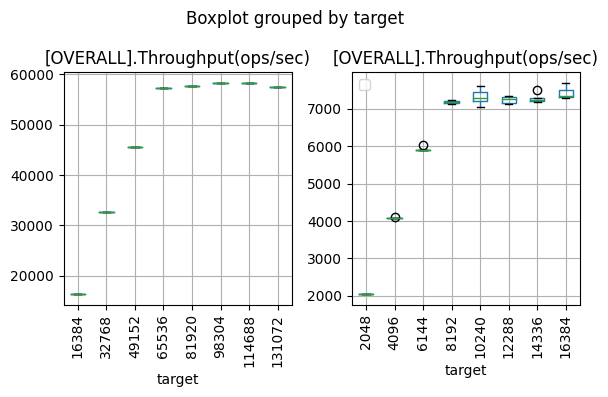

In [40]:
by='target'
column='[OVERALL].Throughput(ops/sec)'
groups = df_groups.groupby('pod_count')
#print(groups)
#print(len(groups))
rows = 1#(len(groups)+1)//2
#print(rows, "rows")
row=0
col=0
fig, axes = plt.subplots(nrows=rows, ncols=2, squeeze=False, figsize=(6,4*rows))#, sharex=True
#print(axes)
for key1, grp in groups:#df3.groupby(col1):
    #print(len(axs))
    #for key2, grp2 in grp.groupby(column):
    #print(grp2)
    #labels = "{} {}, {} {}".format(key1, 'pod_count', key2, column)
    #print(row,col)
    ax = grp.boxplot(ax=axes[row,col], by='target', column='[OVERALL].Throughput(ops/sec)', figsize=(6,4), layout=(rows,2), rot=90)
    #ax.set_ylim(0, df[y].max())
    col = col + 1
    if col > 1:
        row = row + 1
        col = 0
plt.legend(loc='best')
plt.tight_layout()
plt.show()


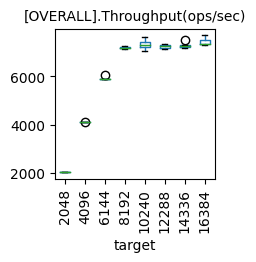

In [41]:
y = "[OVERALL].Throughput(ops/sec)"

plot_variation(df_groups, max_pod_count, y)
#ax = df_groups[df_groups['pod_count']==max_pod_count].boxplot(by='target', column=y, rot=90, figsize=(3,3), grid=False)
#ax.get_figure().suptitle('')

#### UPDATE

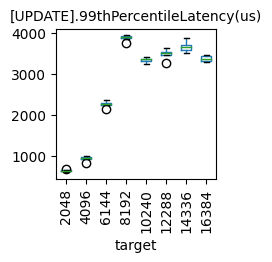

In [42]:
y='[UPDATE].99thPercentileLatency(us)'
plot_variation(df_groups, max_pod_count, y)

#### READ

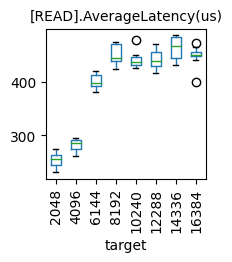

In [43]:
y='[READ].AverageLatency(us)'
plot_variation(df_groups, max_pod_count, y)

### Plot Comparison

#### Throughput

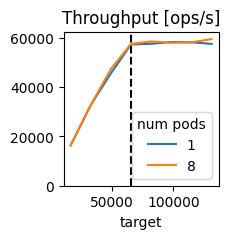

In [44]:
column = "pods"
x = "target"
y = "[OVERALL].Throughput(ops/sec)"
title = "Throughput [ops/s]"
plot_comparison(df_aggregated, x, y, column, title, peak_benchmark)

#### UPDATE

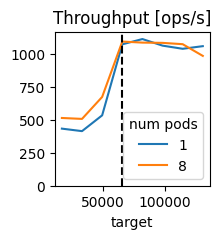

In [45]:
column = "pods"
x = "target"
y = "[UPDATE].95thPercentileLatency(us)"
plot_comparison(df_aggregated, x, y, column, title, peak_benchmark)

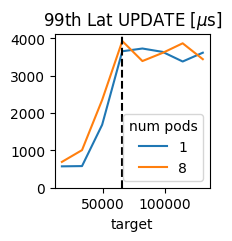

In [46]:
column = "pods"
x = "target"
y = "[UPDATE].99thPercentileLatency(us)"
title = "99th Lat UPDATE [$\mu$s]"
plot_comparison(df_aggregated, x, y, column, title, peak_benchmark)

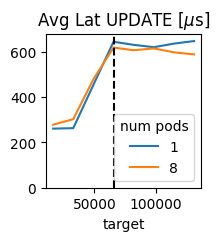

In [47]:
column = "pods"
x = "target"
y = "[UPDATE].AverageLatency(us)"
title = "Avg Lat UPDATE [$\mu$s]"
plot_comparison(df_aggregated, x, y, column, title, peak_benchmark)

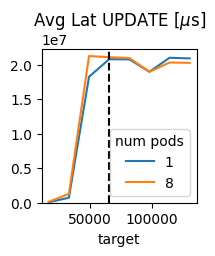

In [48]:
column = "pods"
x = "target"
y = "[UPDATE].MaxLatency(us)"
plot_comparison(df_aggregated, x, y, column, title, peak_benchmark)

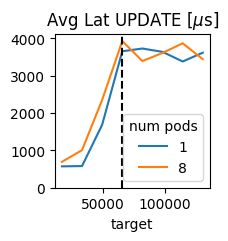

In [49]:
#column = ["threads", "pods"]
column = "pods"
x = "target"
y = "[UPDATE].99thPercentileLatency(us)"
plot_comparison(df_aggregated, x, y, column, title, peak_benchmark)

#### READ

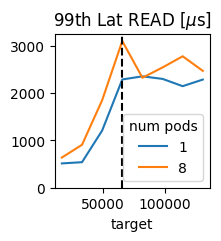

In [50]:
column = "pods"
x = "target"
y = "[READ].99thPercentileLatency(us)"
title = "99th Lat READ [$\mu$s]"
plot_comparison(df_aggregated, x, y, column, title, peak_benchmark)

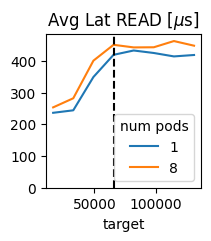

In [51]:
#column = ["threads", "pod_count"]
column = "pods"
x = "target"
y = "[READ].AverageLatency(us)"
title = "Avg Lat READ [$\mu$s]"
plot_comparison(df_aggregated, x, y, column, title, peak_benchmark)

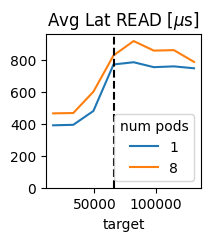

In [52]:
column = "pods"
x = "target"
y = "[READ].95thPercentileLatency(us)"
plot_comparison(df_aggregated, x, y, column, title, peak_benchmark)

#### INSERT

In [53]:
column = "pods"
x = "target"
y = "[INSERT].99thPercentileLatency(us)"
title = "99th Lat INSERT [$\mu$s]"
plot_comparison(df_aggregated, x, y, column, title, peak_benchmark)

[INSERT].99thPercentileLatency(us) not avalable


In [54]:
#column = ["threads", "pod_count"]
column = "pods"
x = "target"
y = "[INSERT].AverageLatency(us)"
title = "Avg Lat INSERT [$\mu$s]"
plot_comparison(df_aggregated, x, y, column, title, peak_benchmark)

[INSERT].AverageLatency(us) not avalable


In [55]:
column = "pods"
x = "target"
y = "[INSERT].95thPercentileLatency(us)"
title = "95th Lat INSERT [$\mu$s]"
plot_comparison(df_aggregated, x, y, column, title, peak_benchmark)

[INSERT].95thPercentileLatency(us) not avalable


#### SCAN

In [56]:
column = "pods"
x = "target"
y = "[SCAN].99thPercentileLatency(us)"
title = "99th Lat SCAN [$\mu$s]"
plot_comparison(df_aggregated, x, y, column, title, peak_benchmark)

[SCAN].99thPercentileLatency(us) not avalable


In [57]:
#column = ["threads", "pod_count"]
column = "pods"
x = "target"
y = "[SCAN].AverageLatency(us)"
title = "Avg Lat SCAN [$\mu$s]"
plot_comparison(df_aggregated, x, y, column, title, peak_benchmark)

[SCAN].AverageLatency(us) not avalable


In [58]:
column = "pods"
x = "target"
y = "[SCAN].95thPercentileLatency(us)"
title = "95th Lat SCAN [$\mu$s]"
plot_comparison(df_aggregated, x, y, column, title, peak_benchmark)

[SCAN].95thPercentileLatency(us) not avalable


# Show Infos about Connections

In [59]:
import ast

with open(path+"/"+code+"/connections.config",'r') as inf:
    connections = ast.literal_eval(inf.read())

print("found", len(connections), "connections")

found 16 connections


In [60]:
import json
#pretty_connections = json.dumps(connections, indent=2)

#print(pretty_connections)

## Loading Time per Number of Loading Threads

In [61]:
connections_sorted = sorted(connections, key=lambda c: c['name']) 

for c in connections_sorted:
    print(c['name'], 
          c['timeLoad'], 
          '[s] for', 
          c['parameter']['connection_parameter']['loading_parameters']['YCSB_THREADCOUNT'], 
          'threads on',
          c['hostsystem']['node'])

PostgreSQL-32-1-114688-1 1068.2056978940964 [s] for 32 threads on ip-192-168-92-229.eu-central-1.compute.internal
PostgreSQL-32-1-131072-1 1087.3417482078075 [s] for 32 threads on ip-192-168-92-229.eu-central-1.compute.internal
PostgreSQL-32-1-16384-1 1834.0904397517443 [s] for 32 threads on ip-192-168-92-229.eu-central-1.compute.internal
PostgreSQL-32-1-32768-1 1062.0822292342782 [s] for 32 threads on ip-192-168-92-229.eu-central-1.compute.internal
PostgreSQL-32-1-49152-1 1065.0029773414135 [s] for 32 threads on ip-192-168-92-229.eu-central-1.compute.internal
PostgreSQL-32-1-65536-1 1033.139736406505 [s] for 32 threads on ip-192-168-92-229.eu-central-1.compute.internal
PostgreSQL-32-1-81920-1 1056.9990959092975 [s] for 32 threads on ip-192-168-92-229.eu-central-1.compute.internal
PostgreSQL-32-1-98304-1 1077.2663244530559 [s] for 32 threads on ip-192-168-92-229.eu-central-1.compute.internal
PostgreSQL-32-8-114688-1 1129.2390964254737 [s] for 4 threads on ip-192-168-92-229.eu-central-1

# Get monitoring metrics

## Loading


### Transform Monitoring Results to DataFrame

This has to be done only once. Transformed Results are stored in result folder.

We also show a list of available metrics.

In [62]:
evaluation.transform_monitoring_results(component="loading")

evaluation.get_monitoring_metrics()

['total_cpu_memory',
 'total_cpu_memory_cached',
 'total_cpu_util',
 'total_cpu_util_max',
 'total_cpu_throttled',
 'total_cpu_util_others',
 'total_cpu_util_s',
 'total_cpu_util_user_s',
 'total_cpu_util_sys_s',
 'total_cpu_throttled_s',
 'total_cpu_util_others_s',
 'total_network_rx',
 'total_network_tx',
 'total_fs_read',
 'total_fs_write',
 'total_gpu_util',
 'total_gpu_power',
 'total_gpu_memory']

### Plot all Metrics

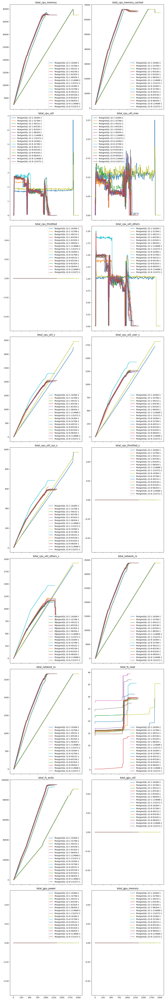

In [63]:
list_metrics = evaluation.get_monitoring_metrics()
row=0
col=0
rows = (len(list_metrics)+1)//2

fig, axes = plt.subplots(nrows=rows, ncols=2, sharex=True, squeeze=False, figsize=(12,8*rows))
for metric in list_metrics:
    df = evaluation.get_monitoring_metric(metric)
    ax = df.plot(ax=axes[row,col], kind='line', title=metric, layout=(rows,2))
    col = col + 1
    if col > 1:
        row = row + 1
        col = 0
plt.legend(loc='best')
plt.tight_layout()
plt.show()

### Plot some Aggregations

#### Compute Time

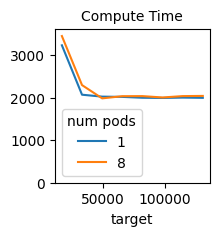

In [64]:
df = evaluation.get_monitoring_metric('total_cpu_util_s', component='loading').max() - evaluation.get_monitoring_metric('total_cpu_util_s', component='loading').min()
plot_metric(df, "Compute Time")

#### Maximum CPU Util

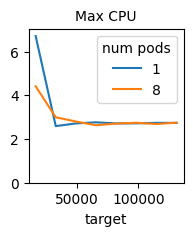

In [65]:
df = evaluation.get_monitoring_metric('total_cpu_util', component='loading').max()
plot_metric(df, "Max CPU")
#df.plot.bar()

#### Maximum Util of a CPU Core

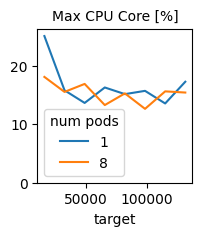

In [66]:
df = evaluation.get_monitoring_metric('total_cpu_util_max', component='loading').max()*100
plot_metric(df, "Max CPU Core [%]")

#### Maxmimum RAM

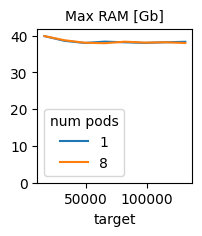

In [67]:
df = evaluation.get_monitoring_metric('total_cpu_memory', component='loading').max()/1000
plot_metric(df, "Max RAM [Gb]")

#### Maxmimum Cache

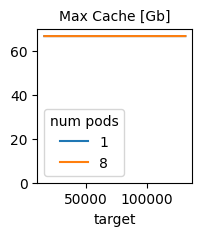

In [68]:
df = evaluation.get_monitoring_metric('total_cpu_memory_cached', component='loading').max()/1000
plot_metric(df, "Max Cache [Gb]")

## Loader Driver

### Transform Monitoring Results to DataFrame

This has to be done only once. Transformed Results are stored in result folder.

We also show a list of available metrics.


In [69]:
evaluation.transform_monitoring_results(component='loader')

evaluation.get_monitoring_metrics()

['total_cpu_memory',
 'total_cpu_memory_cached',
 'total_cpu_util',
 'total_cpu_util_max',
 'total_cpu_throttled',
 'total_cpu_util_others',
 'total_cpu_util_s',
 'total_cpu_util_user_s',
 'total_cpu_util_sys_s',
 'total_cpu_throttled_s',
 'total_cpu_util_others_s',
 'total_network_rx',
 'total_network_tx',
 'total_fs_read',
 'total_fs_write',
 'total_gpu_util',
 'total_gpu_power',
 'total_gpu_memory']

### Plot all Metrics

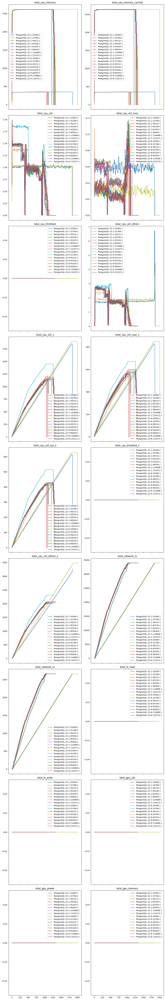

In [70]:
list_metrics = evaluation.get_monitoring_metrics()
row=0
col=0
rows = (len(list_metrics)+1)//2

fig, axes = plt.subplots(nrows=rows, ncols=2, sharex=True, squeeze=False, figsize=(12,8*rows))
for metric in list_metrics:
    df = evaluation.get_monitoring_metric(metric, component='loader')
    #if df.sum().sum() > 0:
    ax = df.plot(ax=axes[row,col], kind='line', title=metric, layout=(rows,2))
    col = col + 1
    if col > 1:
        row = row + 1
        col = 0
plt.legend(loc='best')
plt.tight_layout()
plt.show()

### Plot some Aggregations

#### Compute Time

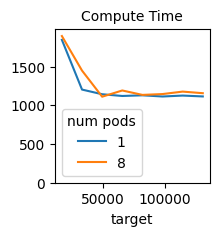

In [71]:
df = evaluation.get_monitoring_metric('total_cpu_util_s', component='loader').max() - evaluation.get_monitoring_metric('total_cpu_util_s', component='loader').min()
plot_metric(df, "Compute Time")

#### Maxmimum CPU Util

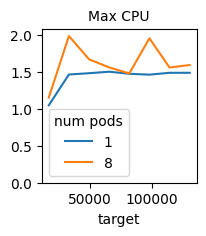

In [72]:
df = evaluation.get_monitoring_metric('total_cpu_util', component='loader').max()
plot_metric(df, "Max CPU")

#### Maximum Util of a CPU Core

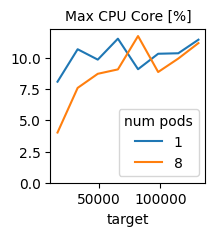

In [73]:
df = evaluation.get_monitoring_metric('total_cpu_util_max', component='loader').max()*100
plot_metric(df, "Max CPU Core [%]")

#### Maximum RAM

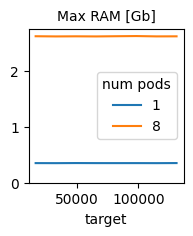

In [74]:
df = evaluation.get_monitoring_metric('total_cpu_memory', component='loader').max()/1000
plot_metric(df, "Max RAM [Gb]")

#### Maximum Cache

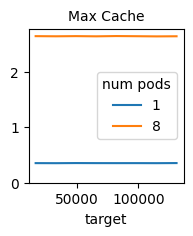

In [75]:
df = evaluation.get_monitoring_metric('total_cpu_memory_cached', component='loader').max()/1000
plot_metric(df, "Max Cache")

## Benchmarking

### Transform Monitoring Results to DataFrame

This has to be done only once. Transformed Results are stored in result folder.

We also show a list of available metrics.


In [76]:
evaluation.transform_monitoring_results(component='stream')

evaluation.get_monitoring_metrics()

['total_cpu_memory',
 'total_cpu_memory_cached',
 'total_cpu_util',
 'total_cpu_util_max',
 'total_cpu_throttled',
 'total_cpu_util_others',
 'total_cpu_util_s',
 'total_cpu_util_user_s',
 'total_cpu_util_sys_s',
 'total_cpu_throttled_s',
 'total_cpu_util_others_s',
 'total_network_rx',
 'total_network_tx',
 'total_fs_read',
 'total_fs_write',
 'total_gpu_util',
 'total_gpu_power',
 'total_gpu_memory']

### Plot all Metrics

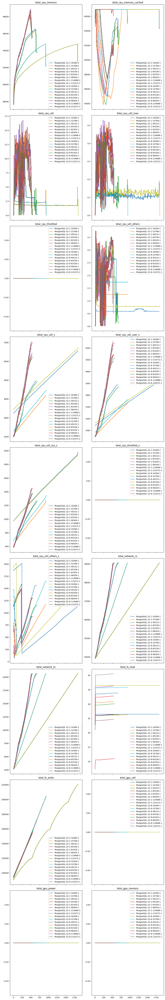

In [77]:
list_metrics = evaluation.get_monitoring_metrics()
row=0
col=0
rows = (len(list_metrics)+1)//2

fig, axes = plt.subplots(nrows=rows, ncols=2, sharex=True, squeeze=False, figsize=(12,8*rows))
for metric in list_metrics:
    df = evaluation.get_monitoring_metric(metric, component='stream')
    #if df.sum().sum() > 0:
    ax = df.plot(ax=axes[row,col], kind='line', title=metric, layout=(rows,2))
    col = col + 1
    if col > 1:
        row = row + 1
        col = 0
plt.legend(loc='best')
plt.tight_layout()
plt.show()

### Plot some Aggregations

#### Compute Time

PostgreSQL-32-1-16384-1     3331.054276
PostgreSQL-32-1-32768-1     2135.833365
PostgreSQL-32-1-49152-1     2860.510238
PostgreSQL-32-1-65536-1     4950.739413
PostgreSQL-32-1-81920-1     5049.445946
PostgreSQL-32-1-98304-1     4894.388010
PostgreSQL-32-1-114688-1    4695.229749
PostgreSQL-32-1-131072-1    4854.766119
PostgreSQL-32-8-16384-1     3250.851061
PostgreSQL-32-8-32768-1     2153.290309
PostgreSQL-32-8-49152-1     2969.004657
PostgreSQL-32-8-65536-1     4392.625075
PostgreSQL-32-8-81920-1     4174.933585
PostgreSQL-32-8-98304-1     4309.111984
PostgreSQL-32-8-114688-1    4379.602404
PostgreSQL-32-8-131072-1    4079.609299
dtype: float64

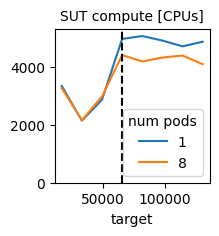

In [78]:
df = evaluation.get_monitoring_metric('total_cpu_util_s', component='stream').max() - evaluation.get_monitoring_metric('total_cpu_util_s', component='stream').min()
plot_metric(df, "SUT compute [CPUs]", peak_benchmark)
df

#### Maximum CPU Util

PostgreSQL-32-1-16384-1      4.973462
PostgreSQL-32-1-32768-1      4.478603
PostgreSQL-32-1-49152-1     13.785709
PostgreSQL-32-1-65536-1     16.049334
PostgreSQL-32-1-81920-1     16.826042
PostgreSQL-32-1-98304-1     15.550890
PostgreSQL-32-1-114688-1    13.336056
PostgreSQL-32-1-131072-1    13.245598
PostgreSQL-32-8-16384-1      2.856713
PostgreSQL-32-8-32768-1      3.039626
PostgreSQL-32-8-49152-1     11.866286
PostgreSQL-32-8-65536-1     14.107406
PostgreSQL-32-8-81920-1     13.991398
PostgreSQL-32-8-98304-1     13.454298
PostgreSQL-32-8-114688-1    15.131495
PostgreSQL-32-8-131072-1    15.122374
dtype: float64

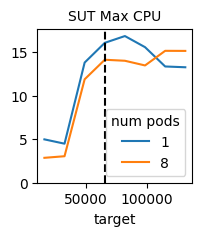

In [79]:
df = evaluation.get_monitoring_metric('total_cpu_util', component='stream').max()
plot_metric(df, "SUT Max CPU", peak_benchmark)
df

#### Maximum Util of a CPU Core

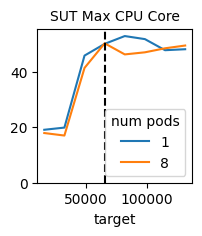

In [80]:
df = evaluation.get_monitoring_metric('total_cpu_util_max', component='stream').max()*100
plot_metric(df, "SUT Max CPU Core", peak_benchmark)

#### Maximum RAM

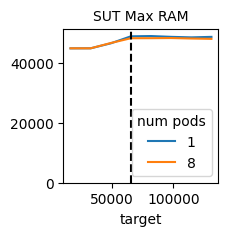

In [81]:
df = evaluation.get_monitoring_metric('total_cpu_memory', component='stream').max()
plot_metric(df, "SUT Max RAM", peak_benchmark)

#### Maximum Cache

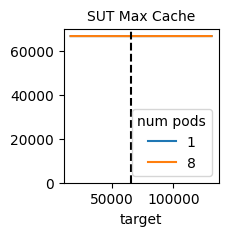

In [82]:
df = evaluation.get_monitoring_metric('total_cpu_memory_cached', component='stream').max()
plot_metric(df, "SUT Max Cache", peak_benchmark)

## Benchmarker Driver

### Transform Monitoring Results to DataFrame

This has to be done only once. Transformed Results are stored in result folder.

We also show a list of available metrics.

In [83]:
evaluation.transform_monitoring_results(component='benchmarker')

evaluation.get_monitoring_metrics()

['total_cpu_memory',
 'total_cpu_memory_cached',
 'total_cpu_util',
 'total_cpu_util_max',
 'total_cpu_throttled',
 'total_cpu_util_others',
 'total_cpu_util_s',
 'total_cpu_util_user_s',
 'total_cpu_util_sys_s',
 'total_cpu_throttled_s',
 'total_cpu_util_others_s',
 'total_network_rx',
 'total_network_tx',
 'total_fs_read',
 'total_fs_write',
 'total_gpu_util',
 'total_gpu_power',
 'total_gpu_memory']

### Plot all Metrics

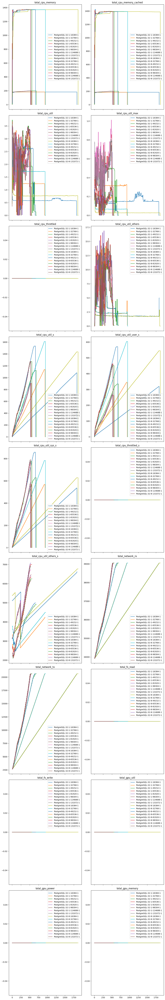

In [84]:
list_metrics = evaluation.get_monitoring_metrics()
row=0
col=0
rows = (len(list_metrics)+1)//2

fig, axes = plt.subplots(nrows=rows, ncols=2, sharex=True, squeeze=False, figsize=(12,8*rows))
for metric in list_metrics:
    df = evaluation.get_monitoring_metric(metric, component='benchmarker')
    #if df.sum().sum() > 0:
    ax = df.plot(ax=axes[row,col], kind='line', title=metric, layout=(rows,2))
    col = col + 1
    if col > 1:
        row = row + 1
        col = 0
plt.legend(loc='best')
plt.tight_layout()
plt.show()

### Plot some Aggregations

#### Compute Time

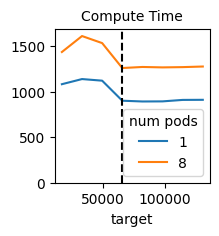

In [85]:
df = evaluation.get_monitoring_metric('total_cpu_util_s', component='benchmarker').max() - evaluation.get_monitoring_metric('total_cpu_util_s', component='benchmarker').min()
plot_metric(df, "Compute Time", peak_benchmark)

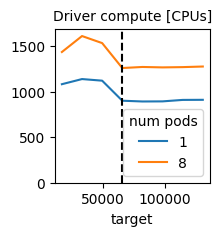

In [86]:
df = evaluation.get_monitoring_metric('total_cpu_util_s', component='benchmarker').max() - evaluation.get_monitoring_metric('total_cpu_util_s', component='benchmarker').min()
plot_metric(df, "Driver compute [CPUs]", peak_benchmark)

#### Maximum CPU Util

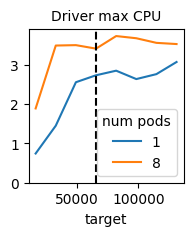

In [87]:
df = evaluation.get_monitoring_metric('total_cpu_util', component='benchmarker').max()
plot_metric(df, "Driver max CPU", peak_benchmark)

#### Maximum Util of a CPU Core

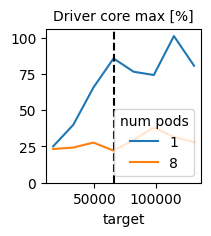

In [88]:
df = evaluation.get_monitoring_metric('total_cpu_util_max', component='benchmarker').max()*100
plot_metric(df, "Driver core max [%]", peak_benchmark)
plt.legend(loc='lower right', title='num pods')

#### Maximum RAM

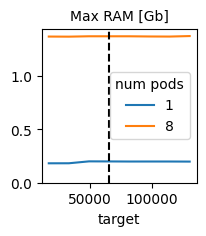

In [89]:
df = evaluation.get_monitoring_metric('total_cpu_memory', component='benchmarker').max()/1000
plot_metric(df, "Max RAM [Gb]", peak_benchmark)

#### Maximum Cache

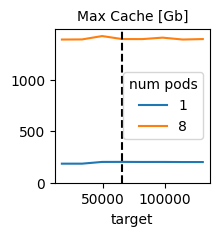

In [90]:
df = evaluation.get_monitoring_metric('total_cpu_memory_cached', component='benchmarker').max()
plot_metric(df, "Max Cache [Gb]", peak_benchmark)